In [1]:
import os
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from imblearn.over_sampling import RandomOverSampler
import torch
from torch.utils.data import Dataset
from skimage.transform import rotate, warp, AffineTransform
from skimage.filters import gaussian
from skimage.util import random_noise
from numpy.random import *
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ExponentialLR
from sklearn.metrics import *
from tqdm import tqdm

In [2]:
# // READING THE CSV FILE

root = os.getcwd() # // ROOT IS THE PARENT DIRECTORY OF THE CURRENT DIRECTORY
ds_name = "fer2013.csv"
fp = os.path.join(root, ds_name)

df = pd.read_csv(fp)
df.head()

,emotion,pixels,Usage
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training


In [3]:
#  // PIXELS ARE PROVIDED AS LIST OF STRINGS SO WE PROCESS THEM TO NUMPY ARRAY

img_pixels =  [np.asarray(x, dtype=float) for x in df.pixels.str.split(' ').tolist()]
#img_pixels[:5] 

In [4]:
def value_to_onehot(x):
    return np.eye(7, dtype=float)[x]

emotions_onehot = [value_to_onehot(x) for x in df.emotion] #  // ONE HOT ENCODING FOR EVERY EMOTION
emotions_onehot[:5]

[array([1., 0., 0., 0., 0., 0., 0.]),
 array([1., 0., 0., 0., 0., 0., 0.]),
 array([0., 0., 1., 0., 0., 0., 0.]),
 array([0., 0., 0., 0., 1., 0., 0.]),
 array([0., 0., 0., 0., 0., 0., 1.])]

In [5]:
emotions = ['anger', 'disgust', 'fear', 'happiness', 'sadness', 'surprise', 'neutral'] # // TEXT ANNOTATION FOR EVERY EMOTION
emotion_names = [emotions[x] for x in df.emotion]
emotion_names[:5]

['anger', 'anger', 'fear', 'sadness', 'neutral']

In [6]:
d = {'usage': df.Usage.values, 'image': img_pixels, 'emotion_idx': df.emotion, 'emotion_onehot': emotions_onehot, 'emotion_name': emotion_names} #  // MAKING THE PANDAS DATAFRAME
df2 = pd.DataFrame(data=d) 
df2.head()

,usage,image,emotion_idx,emotion_onehot,emotion_name
0,Training,"[70.0, 80.0, 82.0, 72.0, 58.0, 58.0, 60.0, 63....",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
1,Training,"[151.0, 150.0, 147.0, 155.0, 148.0, 133.0, 111...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
2,Training,"[231.0, 212.0, 156.0, 164.0, 174.0, 138.0, 161...",2,"[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0]",fear
3,Training,"[24.0, 32.0, 36.0, 30.0, 32.0, 23.0, 19.0, 20....",4,"[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]",sadness
4,Training,"[4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",neutral


In [7]:
#  // VISUALIZING THE DATASET DISTRIBUTION

px.pie(df2.groupby("usage").size().reset_index(), names="usage", values=0, title="Number of samples per dataset")

In [8]:
#  // DISTRIBUTION OF CLASS ENTRIES

px.bar(df2.groupby(["emotion_name", "usage"]).size().reset_index(), x="emotion_name", y=0, color="usage" ,title="Class distribution of samples")

In [9]:
black = df2.image.apply(np.max) == 0 #  // CHECKING FILE FOR EMPTY (BLACK) IMAGES
df2[black]

,usage,image,emotion_idx,emotion_onehot,emotion_name
6458,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
7629,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]",happiness
10423,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]",sadness
11286,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
13148,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
13402,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
13988,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,"[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]",surprise
15894,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
22198,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
22927,Training,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",neutral


In [10]:
df3 = df2[np.logical_not(black)] #  // REMOVING BLACK IMAGES FROM DATASET
df3.head()

,usage,image,emotion_idx,emotion_onehot,emotion_name
0,Training,"[70.0, 80.0, 82.0, 72.0, 58.0, 58.0, 60.0, 63....",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
1,Training,"[151.0, 150.0, 147.0, 155.0, 148.0, 133.0, 111...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
2,Training,"[231.0, 212.0, 156.0, 164.0, 174.0, 138.0, 161...",2,"[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0]",fear
3,Training,"[24.0, 32.0, 36.0, 30.0, 32.0, 23.0, 19.0, 20....",4,"[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]",sadness
4,Training,"[4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",neutral


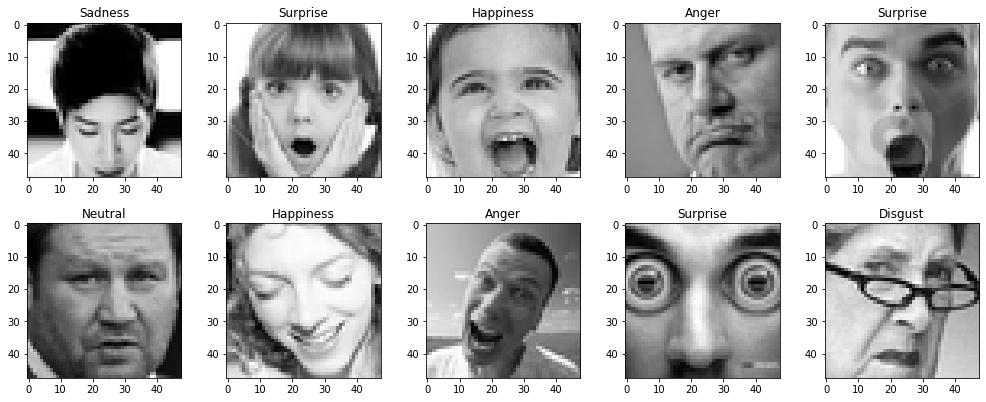

In [11]:
# // VISUALIZING SOME IMAGES IN THE DATASET

row, col = 2, 5
img_size = 14 
fig, axes = plt.subplots(row, col, figsize=(img_size,img_size*row/col))
fig.tight_layout()
fig.subplots_adjust(hspace=.25)
for i in range(row): #  // PLOTTING SOME RANDOM IMAGES ALONG WITH THEIR EMOTION
    for j in range(col):
        ax = axes[i,j]
        k = np.random.randint(len(df3.image)) 
        img = df3.image[k].reshape(48,48)
        lbl = df3.emotion_name[k].capitalize() 
        ax.set_title(f'{lbl}')
        ax.imshow(img, cmap='gray')

In [12]:
#  //PRINCIPAL COMPONENT ANALYSIS

pca = PCA(3)
t = df3.image.values.copy()
t = np.array([(x-x.min()) / (x.max() - x.min()) for x in t])
t = pca.fit_transform(t)
px.scatter_3d(x=t[:,0], y=t[:,1], z=t[:,2], color=df3.emotion_idx)

In [13]:
#  // SPLITTING THE DATASET ACCORDING TO THE IMAGE USAGE (TRAIN, PUBLIC TEST AND PRIVATE TEST=EVALUATION)

train = df3[df3.usage == 'Training'].reset_index(drop=True)
pub_test = df3[df3.usage == 'PublicTest'].reset_index(drop=True)
priv_test = df3[df3.usage == 'PrivateTest'].reset_index(drop=True)

In [14]:
train.head()

,usage,image,emotion_idx,emotion_onehot,emotion_name
0,Training,"[70.0, 80.0, 82.0, 72.0, 58.0, 58.0, 60.0, 63....",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
1,Training,"[151.0, 150.0, 147.0, 155.0, 148.0, 133.0, 111...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
2,Training,"[231.0, 212.0, 156.0, 164.0, 174.0, 138.0, 161...",2,"[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0]",fear
3,Training,"[24.0, 32.0, 36.0, 30.0, 32.0, 23.0, 19.0, 20....",4,"[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]",sadness
4,Training,"[4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",neutral


In [15]:
pub_test.head()

,usage,image,emotion_idx,emotion_onehot,emotion_name
0,PublicTest,"[254.0, 254.0, 254.0, 254.0, 254.0, 249.0, 255...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
1,PublicTest,"[156.0, 184.0, 198.0, 202.0, 204.0, 207.0, 210...",1,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]",disgust
2,PublicTest,"[69.0, 118.0, 61.0, 60.0, 96.0, 121.0, 103.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]",sadness
3,PublicTest,"[205.0, 203.0, 236.0, 157.0, 83.0, 158.0, 120....",6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",neutral
4,PublicTest,"[87.0, 79.0, 74.0, 66.0, 74.0, 96.0, 77.0, 80....",3,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]",happiness


In [16]:
priv_test.head()

,usage,image,emotion_idx,emotion_onehot,emotion_name
0,PrivateTest,"[170.0, 118.0, 101.0, 88.0, 88.0, 75.0, 78.0, ...",0,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",anger
1,PrivateTest,"[7.0, 5.0, 8.0, 6.0, 7.0, 3.0, 2.0, 6.0, 5.0, ...",5,"[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]",surprise
2,PrivateTest,"[232.0, 240.0, 241.0, 239.0, 237.0, 235.0, 246...",6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",neutral
3,PrivateTest,"[200.0, 197.0, 149.0, 139.0, 156.0, 89.0, 111....",4,"[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]",sadness
4,PrivateTest,"[40.0, 28.0, 33.0, 56.0, 45.0, 33.0, 31.0, 78....",2,"[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0]",fear


In [17]:
#  // OVERSAMPLING (RANDOM) IN ORDER TO BALANCE THE DATASET, DUE TO CLASSES HAVING LOW ENTRIES, FOR EXAMPLE DISGUST

oversampler = RandomOverSampler()
train, _ = oversampler.fit_resample(train, train.emotion_idx)
train = train.sample(frac=1).reset_index(drop=True) # Shuffle the training set after oversampling in order to avoid blocks with same label
px.bar(train.groupby(["emotion_name"]).size().reset_index(), x="emotion_name", y=0,title="Class distribution of samples")

In [18]:
#  // CLASS THAT WILL BE USED FOR DATALOADING, ALONG WITH TRANSFORMATION

class ImgDataset(Dataset):
    
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx.tolist()
        img = self.df.image[idx]
        lbl = self.df.emotion_idx[idx] # // LABEL FROM ONE HOT ENCODING
        sample = (img, lbl) 
        if self.transform:
            sample = self.transform(sample)
        return sample

In [19]:
#  // DATA AUGMENTATION INCLUDES ROTATION, WAPRING, FLIPPING, GAUSSIAN BLURRING AND RANDOM NOISE FOR A MORE ROBUST DATASET TRAINING

class Augment(object):
    
    def __init__(self, rotate=100, warp=100, flip_lr=100, gaussian=100, random_noise=100): #  // PROBABILITY OF EACH TRANSFORMATION TECHNIQUE
        self.rotate = rotate
        self.warp = warp
        self.flip_lr = flip_lr
        self.gaussian = gaussian
        self.random_noise = random_noise
    
    def __call__(self, sample):
        img, lbl = sample
        if randint(0,100) < self.rotate: img = rotate(img, angle=uniform(-30,30), mode='edge')
        if randint(0,100) < self.warp: img = warp(img, AffineTransform(translation=(uniform(-7,7), uniform(-7,7))), mode='edge')
        if randint(0,100) < self.flip_lr: img = [img, np.fliplr(img)][choice([0,1])]
        if randint(0,100) < self.gaussian: img = gaussian(img, sigma=uniform(.0,.8), multichannel=True)
        if randint(0,100) < self.random_noise: img = random_noise(img/255, var=uniform(.0,.0008))*255
        return (img, lbl)

In [20]:
#  // CLASS THAT RESHAPES THE DATA FROM 1 DIMENSION TO 2 DIMENSION (48X48)

class Reshape(object):
    
    def __init__(self, one_channel=False):
        self.one_channel = one_channel
    
    def __call__(self, sample):
        img, lbl = sample
        r = None
        if self.one_channel:
            r = img.reshape(1, 48, 48)
        else:
            r = img.reshape(48, 48)
        return (r, lbl)

In [21]:
#  // NORMALIZING EACH PIXEL TO RANGE [0,1]

class Rescale(object):
    
    def __call__(self, sample):
        img, lbl = sample
        return (img/255.0, lbl)

In [22]:
#  // CREATING DATALOADERS FOR EACH SET (TRAINING, PUBLIC TESTING AND PRIVATE TESTING)

batch_size = 64                                                                                         #  // BATCH SIZE FOR LOADING, TO BE CHANGED ACCORDING TO AVAILABLE GPU MEMORY. TOO HIGH VALUE CAN RESULT IN ERRORS WHEN TRAINING

train_transform = transforms.Compose([Reshape(one_channel=False), Augment(), Rescale(), Reshape(one_channel=True)])
train_ds = ImgDataset(train, train_transform)

test_transform = transforms.Compose([Reshape(one_channel=False), Rescale(), Reshape(one_channel=True)]) # // THE TEST SETS WILL NOT BE AUGMENTED IN ANY WAY
pub_test_ds = ImgDataset(pub_test, test_transform)
priv_test_ds = ImgDataset(priv_test, test_transform)

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=0)
pub_test_dl = DataLoader(pub_test_ds, batch_size=batch_size, shuffle=False, num_workers=0) 
priv_test_dl = DataLoader(priv_test_ds, batch_size=batch_size, shuffle=False, num_workers=0)

In [23]:
# // SELECTING GPU IF AVAILABLE. OUR TRAINING WAS DONE IN GPU

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda:0


In [24]:
#  // CREATING THE CNN CLASS, ALONG WITH THE DIFFERENT LAYERS FOR VISUALIZATION LATER

class MODEL7V3(nn.Module):
    def __init__(self):
        super(MODEL7V3, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 5, padding='same')
        
        self.conv2 = nn.Conv2d(32, 64, 5, padding='same')
        self.batchnorm1 = nn.BatchNorm2d(64)
        self.pool = nn.MaxPool2d(2, 2)
        
        
        self.conv3 = nn.Conv2d(64, 128, 7, padding='same')
        
        self.conv4 = nn.Conv2d(128, 256, 7, padding='same')
        self.batchnorm2 = nn.BatchNorm2d(256)
        
        
        self.fc1 = nn.Linear(36864, 128) 
        self.batchnorm3 = nn.BatchNorm1d(128)
        self.dropout1 = nn.Dropout(.2)
        self.fc2 = nn.Linear(128, 32)
        self.batchnorm4 = nn.BatchNorm1d(32)
        self.dropout2 = nn.Dropout(.2)
        self.fc3 = nn.Linear(32, 7)        
       
 
    def forward(self, x, training=False):
        #  // LAYER 1
        x = F.leaky_relu(self.conv1(x), negative_slope=0.01)
        
        #  // LAYER 2
        x = F.leaky_relu(self.conv2(x), negative_slope=0.01)
        x = self.batchnorm1(x)
        x = self.pool(x)
        
        #  // LAYER 3
        x = F.leaky_relu(self.conv3(x), negative_slope=0.01)
        
        #  // LAYER 4
        x = F.leaky_relu(self.conv4(x), negative_slope=0.01)
        x = self.batchnorm2(x)
        x = self.pool(x)
        
        #  // OUT
        x = torch.flatten(x, 1)
        x = self.batchnorm3(F.relu(self.fc1(x)))
        x = self.dropout1(x)
        x = self.batchnorm4(F.relu(self.fc2(x)))
        x = self.dropout2(x)
        x = F.softmax(self.fc3(x), dim=1)       
        return x
    
    def getLayer1(self, x, training=False):
        #  // LAYER 1
        x = F.leaky_relu(self.conv1(x), negative_slope=0.01)
        return x
    
    def getLayer2(self, x, training=False):
        #  // LAYER 1
        x = F.leaky_relu(self.conv1(x), negative_slope=0.01)
        
        #  // LAYER 2
        x = F.leaky_relu(self.conv2(x), negative_slope=0.01)
        x = self.batchnorm1(x)
        x = self.pool(x)       
        return x
    
    def getLayer3(self, x, training=False):
        #  // LAYER 1
        x = F.leaky_relu(self.conv1(x), negative_slope=0.01)
        
        #  // LAYER 2
        x = F.leaky_relu(self.conv2(x), negative_slope=0.01)
        x = self.batchnorm1(x)
        x = self.pool(x)
        
        #  // LAYER 3
        x = F.leaky_relu(self.conv3(x), negative_slope=0.01)
        return x
    
    def getLayer4(self, x, training=False):
        #  // LAYER 1
        x = F.leaky_relu(self.conv1(x), negative_slope=0.01)
        
        #  // LAYER 2
        x = F.leaky_relu(self.conv2(x), negative_slope=0.01)
        x = self.batchnorm1(x)
        x = self.pool(x)
        
        #  // LAYER 3
        x = F.leaky_relu(self.conv3(x), negative_slope=0.01)
        
        #  // LAYER 4
        x = F.leaky_relu(self.conv4(x), negative_slope=0.01)
        x = self.batchnorm2(x)
        x = self.pool(x)
        return x

In [25]:
net = MODEL7V3().to(device)                                               #  // MOVING TO GPU FOR GPU TRAINING
model_parameters = filter(lambda p: p.requires_grad, net.parameters())
params = sum([np.prod(p.size()) for p in model_parameters])
print (net)
print(f"The network has {params} trainable parameters")                #  // NUMBER OF TRAINABLE PARAMETERS

MODEL7V3(
  (conv1): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (conv2): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (batchnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(64, 128, kernel_size=(7, 7), stride=(1, 1), padding=same)
  (conv4): Conv2d(128, 256, kernel_size=(7, 7), stride=(1, 1), padding=same)
  (batchnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=36864, out_features=128, bias=True)
  (batchnorm3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout1): Dropout(p=0.2, inplace=False)
  (fc2): Linear(in_features=128, out_features=32, bias=True)
  (batchnorm4): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout2): Dropout(p=0.2, inplace=False)
  (f

In [26]:
#  // TRAINING THE MODEL
net = MODEL7V3().to(device)
loss_func = torch.nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=1e-4)
scheduler = ExponentialLR(optimizer, gamma=0.93, verbose=True)
 
epochs = 20

history_train, history_val, history_loss = [], [], []

for epoch in range(epochs):
    running_loss = 0.0
    print(f'Epoch {epoch+1}')
    
    #  // TRAINING THE MODEL
    
    train_metrics = {'labels': [], 'outputs': [], 'n_samples': len(train)}

    with tqdm(enumerate(train_dl, 0), total=len(train_dl), mininterval=1) as pbar:
        for i, data in pbar:
            inputs, labels = data 
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = net(inputs.float())
            outputs_idx = outputs.argmax(axis=1)

            train_metrics['labels'] += labels.tolist()
            train_metrics['outputs'] += outputs_idx.tolist()

            loss = loss_func(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

            if i % 100 == 99:                                #   // LOSS IS UPDATED EVERY 100 BATCHES
                history_loss.append(running_loss / 100)
                pbar.set_description('loss: %.3f' % (running_loss / 100))
                running_loss = 0.0
                
    scheduler.step()  #  // EXPONENTIAL DECAY

    acc = accuracy_score(train_metrics['labels'], train_metrics['outputs'])
    print('Training accuracy: {acc:.2f}%'.format(acc=acc*100))
    history_train.append(train_metrics)

    #  // VALIDATION IS PERFORMED ON PUBLIC TEST SET 
        
    val_metrics = {'labels': [], 'outputs': [], 'n_samples': len(pub_test)}

    for i, data in enumerate(pub_test_dl, 0):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = net(inputs.float())
        outputs_idx = outputs.argmax(axis=1)

        val_metrics['labels'] += labels.tolist()
        val_metrics['outputs'] += outputs_idx.tolist()

    acc = accuracy_score(val_metrics['labels'], val_metrics['outputs'])
    print('Validation accuracy: {acc:.2f}%'.format(acc=acc*100))
    history_val.append(val_metrics)

Adjusting learning rate of group 0 to 1.0000e-04.
Epoch 1


loss: 1.873: 100%|██████████| 790/790 [01:50<00:00,  7.13it/s]


Adjusting learning rate of group 0 to 9.3000e-05.
Training accuracy: 24.97%
Validation accuracy: 28.18%
Epoch 2


loss: 1.794: 100%|██████████| 790/790 [01:44<00:00,  7.55it/s]


Adjusting learning rate of group 0 to 8.6490e-05.
Training accuracy: 34.42%
Validation accuracy: 40.77%
Epoch 3


loss: 1.723: 100%|██████████| 790/790 [01:44<00:00,  7.53it/s]


Adjusting learning rate of group 0 to 8.0436e-05.
Training accuracy: 42.92%
Validation accuracy: 44.23%
Epoch 4


loss: 1.680: 100%|██████████| 790/790 [01:44<00:00,  7.55it/s]


Adjusting learning rate of group 0 to 7.4805e-05.
Training accuracy: 47.76%
Validation accuracy: 45.68%
Epoch 5


loss: 1.655: 100%|██████████| 790/790 [01:44<00:00,  7.54it/s]


Adjusting learning rate of group 0 to 6.9569e-05.
Training accuracy: 50.70%
Validation accuracy: 46.99%
Epoch 6


loss: 1.633: 100%|██████████| 790/790 [01:44<00:00,  7.55it/s]


Adjusting learning rate of group 0 to 6.4699e-05.
Training accuracy: 53.37%
Validation accuracy: 49.08%
Epoch 7


loss: 1.618: 100%|██████████| 790/790 [01:44<00:00,  7.54it/s]


Adjusting learning rate of group 0 to 6.0170e-05.
Training accuracy: 55.12%
Validation accuracy: 49.02%
Epoch 8


loss: 1.608: 100%|██████████| 790/790 [01:44<00:00,  7.56it/s]


Adjusting learning rate of group 0 to 5.5958e-05.
Training accuracy: 56.14%
Validation accuracy: 51.28%
Epoch 9


loss: 1.596: 100%|██████████| 790/790 [01:44<00:00,  7.54it/s]


Adjusting learning rate of group 0 to 5.2041e-05.
Training accuracy: 57.34%
Validation accuracy: 50.84%
Epoch 10


loss: 1.584: 100%|██████████| 790/790 [01:44<00:00,  7.54it/s]


Adjusting learning rate of group 0 to 4.8398e-05.
Training accuracy: 58.76%
Validation accuracy: 52.03%
Epoch 11


loss: 1.575: 100%|██████████| 790/790 [01:44<00:00,  7.53it/s]


Adjusting learning rate of group 0 to 4.5010e-05.
Training accuracy: 59.44%
Validation accuracy: 53.01%
Epoch 12


loss: 1.568: 100%|██████████| 790/790 [01:44<00:00,  7.53it/s]


Adjusting learning rate of group 0 to 4.1860e-05.
Training accuracy: 60.31%
Validation accuracy: 53.65%
Epoch 13


loss: 1.549: 100%|██████████| 790/790 [01:45<00:00,  7.52it/s]


Adjusting learning rate of group 0 to 3.8929e-05.
Training accuracy: 60.98%
Validation accuracy: 54.24%
Epoch 14


loss: 1.555: 100%|██████████| 790/790 [01:44<00:00,  7.53it/s]


Adjusting learning rate of group 0 to 3.6204e-05.
Training accuracy: 61.71%
Validation accuracy: 54.38%
Epoch 15


loss: 1.548: 100%|██████████| 790/790 [01:45<00:00,  7.52it/s]


Adjusting learning rate of group 0 to 3.3670e-05.
Training accuracy: 62.12%
Validation accuracy: 54.65%
Epoch 16


loss: 1.537: 100%|██████████| 790/790 [01:45<00:00,  7.51it/s]


Adjusting learning rate of group 0 to 3.1313e-05.
Training accuracy: 63.27%
Validation accuracy: 54.71%
Epoch 17


loss: 1.532: 100%|██████████| 790/790 [01:45<00:00,  7.51it/s]


Adjusting learning rate of group 0 to 2.9121e-05.
Training accuracy: 63.55%
Validation accuracy: 54.21%
Epoch 18


loss: 1.529: 100%|██████████| 790/790 [01:45<00:00,  7.51it/s]


Adjusting learning rate of group 0 to 2.7083e-05.
Training accuracy: 64.16%
Validation accuracy: 56.27%
Epoch 19


loss: 1.523: 100%|██████████| 790/790 [01:45<00:00,  7.52it/s]


Adjusting learning rate of group 0 to 2.5187e-05.
Training accuracy: 64.33%
Validation accuracy: 54.46%
Epoch 20


loss: 1.522: 100%|██████████| 790/790 [01:44<00:00,  7.52it/s]


Adjusting learning rate of group 0 to 2.3424e-05.
Training accuracy: 64.94%
Validation accuracy: 55.18%


In [27]:
#  // METRICS FOR TRAINING AND VALIDATION, USED FOR PLOTTING 

history_train_metrics = {
    'accuracy_score': [accuracy_score(t['labels'], t['outputs']) for t in history_train],
    'balanced_accuracy_score': [balanced_accuracy_score(t['labels'], t['outputs']) for t in history_train],
    'precision_score': [precision_score(t['labels'], t['outputs'], average='macro') for t in history_train],
    'recall_score': [recall_score(t['labels'], t['outputs'], average='macro') for t in history_train],
    'f1_score': [f1_score(t['labels'], t['outputs'], average='macro') for t in history_train],
    'balanced_accuracy_score': [balanced_accuracy_score(t['labels'], t['outputs']) for t in history_train],
    'type': ["Training" for t in history_val],
    'epoch': list(range(len(history_val)))
}

history_val_metrics = {
    'accuracy_score': [accuracy_score(t['labels'], t['outputs']) for t in history_val],
    'balanced_accuracy_score': [balanced_accuracy_score(t['labels'], t['outputs']) for t in history_val],
    'precision_score': [precision_score(t['labels'], t['outputs'], average='macro') for t in history_val],
    'recall_score': [recall_score(t['labels'], t['outputs'], average='macro') for t in history_val],
    'f1_score': [f1_score(t['labels'], t['outputs'], average='macro') for t in history_val],
    'balanced_accuracy_score': [balanced_accuracy_score(t['labels'], t['outputs']) for t in history_val],
    'type': ["Validation" for t in history_val],
    'epoch': list(range(len(history_val)))
}

In [28]:
history_train_metrics = pd.DataFrame(history_train_metrics)
history_val_metrics = pd.DataFrame(history_val_metrics)
history_metrics = pd.concat([history_train_metrics, history_val_metrics]).reset_index(drop=True)
history_metrics

,accuracy_score,balanced_accuracy_score,precision_score,recall_score,f1_score,type,epoch
0,0.249693,0.249693,0.239729,0.249693,0.239872,Training,0
1,0.344231,0.344231,0.319185,0.344231,0.319730,Training,1
2,0.429166,0.429166,0.397789,0.429166,0.397106,Training,2
3,0.477603,0.477603,0.449622,0.477603,0.445473,Training,3
4,0.507010,0.507010,0.484076,0.507010,0.478280,Training,4
5,0.533744,0.533744,0.514754,0.533744,0.508345,Training,5
6,0.551151,0.551151,0.533250,0.551151,0.528344,Training,6
7,0.561369,0.561369,0.547055,0.561369,0.541171,Training,7
8,0.573369,0.573369,0.560026,0.573369,0.554564,Training,8
9,0.587607,0.587607,0.574740,0.587607,0.570092,Training,9


In [29]:
iter_per_epoch = len(train_dl) // 100
history_loss = pd.DataFrame({'loss': history_loss, 'epoch': [t / iter_per_epoch for t in range(len(history_loss))]})
history_loss

,loss,epoch
0,1.932587,0.000000
1,1.915350,0.142857
2,1.903041,0.285714
3,1.894356,0.428571
4,1.884607,0.571429
...,...,...
135,1.517568,19.285714
136,1.518613,19.428571
137,1.509579,19.571429
138,1.531575,19.714286


In [30]:
#  // PLOTTING ACCURACY OVER EPOCHS

px.line(history_metrics, x="epoch", y="accuracy_score", color="type").show()

In [31]:
#  // PLOTTING LOSS OVER EPOCHS

px.line(history_loss, x='epoch', y='loss')

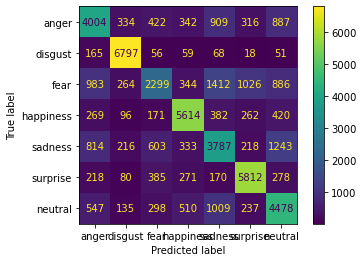

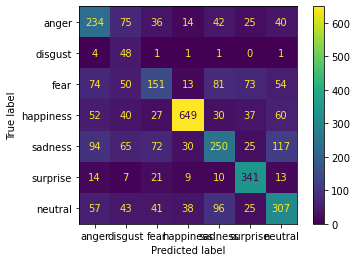

In [32]:
#  // CONFUSION MATRIX, BOTH FOR TRAINING AND VALIDAITON

ConfusionMatrixDisplay(confusion_matrix(history_train[-1]['labels'], history_train[-1]['outputs']), display_labels=emotions).plot() 
ConfusionMatrixDisplay(confusion_matrix(history_val[-1]['labels'], history_val[-1]['outputs']), display_labels=emotions).plot() 

Test accuracy: 57.15%
Test precision (macro): 52.55%
Test recall (macro): 60.46%
Test f1: 52.43%


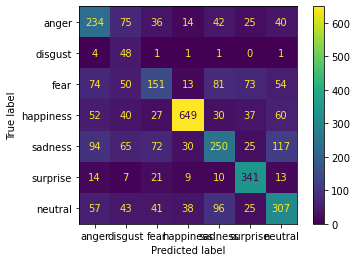

In [33]:
#  // CONFUSION MATRIX ON PRIVATE TEST SET ALONG WITH THE METRICS REQUIRED

test_metrics = {'labels': [], 'outputs': [], 'n_samples': len(pub_test)}

for i, data in enumerate(priv_test_dl, 0):
    inputs, labels = data
    inputs = inputs.to(device)
    labels = labels.to(device)

    outputs = net(inputs.float())
    outputs_idx = outputs.argmax(axis=1)

    test_metrics['labels'] += labels.tolist()
    test_metrics['outputs'] += outputs_idx.tolist()

print('Test accuracy: {acc:.2f}%'.format(acc=accuracy_score(test_metrics['labels'], test_metrics['outputs'])*100))
print('Test precision (macro): {acc:.2f}%'.format(acc=precision_score(test_metrics['labels'], test_metrics['outputs'], average="macro")*100))
print('Test recall (macro): {acc:.2f}%'.format(acc=recall_score(test_metrics['labels'], test_metrics['outputs'], average="macro")*100))
print('Test f1: {acc:.2f}%'.format(acc=f1_score(test_metrics['labels'], test_metrics['outputs'], average="macro")*100))
ConfusionMatrixDisplay(confusion_matrix(history_val[-1]['labels'], history_val[-1]['outputs']), display_labels=emotions).plot() # Test

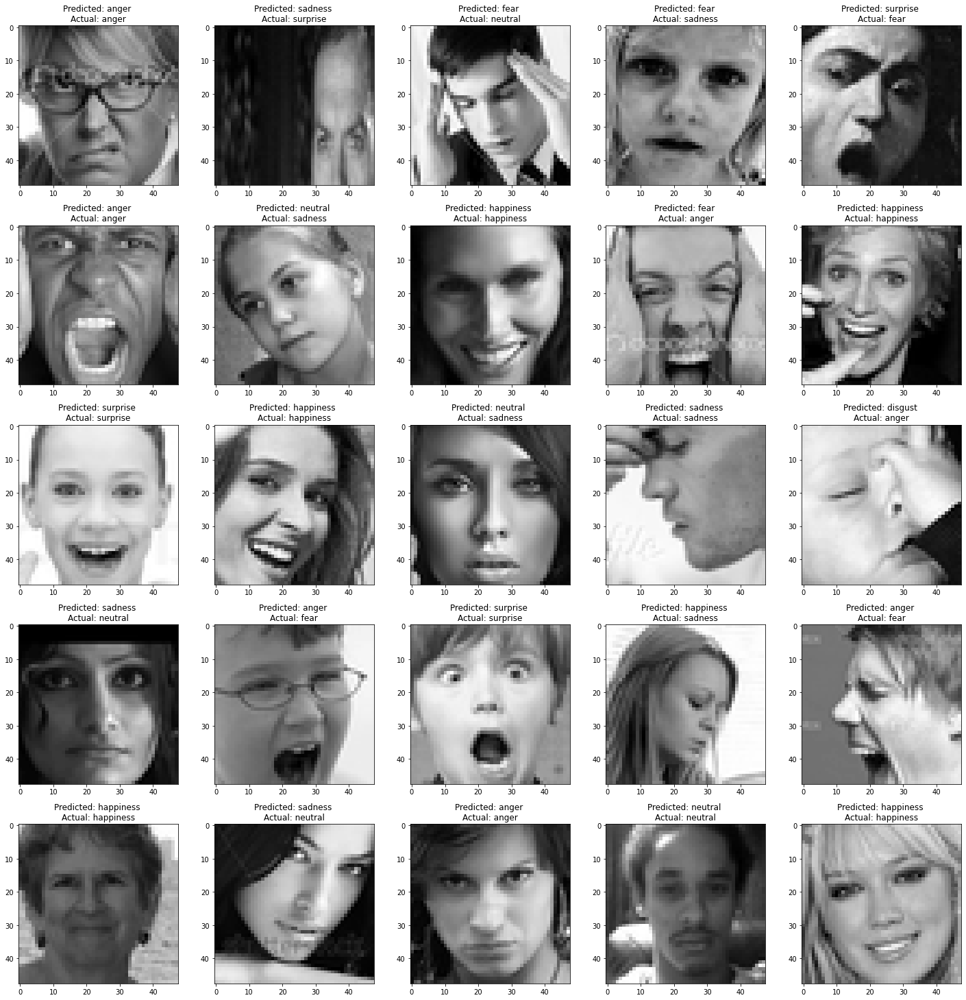

In [34]:
#  // VISUALIZING SOME OF THE PREDICTIONS

row, col = 5, 5
img_size = 20 
fig, axes = plt.subplots(row, col, figsize=(img_size,img_size*row/col))
fig.tight_layout()
fig.subplots_adjust(hspace=.25)

imgs, lbls = next(iter(priv_test_dl))

pred = net(imgs.to(device).float()).argmax(axis=1).cpu()


for i in range(row):
    for j in range(col):
        ax = axes[i,j]
        k = i * row + j
        img = imgs[k].reshape(48,48)
        lbl = "Predicted: " + emotions[pred[k]] + " \nActual: " + emotions[lbls[k]] 
        ax.set_title(f'{lbl}')
        ax.imshow(img, cmap='gray')

In [35]:
#  // SAVING THE CALCULATED METRICS

exp_path = './MODEL7V3/'
os.makedirs(exp_path)
history_metrics.to_csv(exp_path + 'history_metrics.csv')
history_loss.to_csv(exp_path + 'history_loss.csv')

history_full = pd.concat([pd.DataFrame(history_val).assign(type='Validation'), pd.DataFrame(history_train).assign(type='Training')])
history_full.to_csv(exp_path + 'history_full.csv', header=True)

In [36]:
#  // VISUALIZATION OF THE FILTERS IN OUR CNN

inputs, labels = next(iter(train_dl))

input_img = inputs[0][0].numpy()

inputs = inputs.to(device)
labels = labels.to(device)

outputs1 = net.getLayer1(inputs.float(), training=False)
outputs1 = outputs1[0].cpu().detach().numpy()

outputs2 = net.getLayer2(inputs.float(), training=False)
outputs2 = outputs2[0].cpu().detach().numpy()

outputs3 = net.getLayer3(inputs.float(), training=False) 
outputs3 = outputs3[0].cpu().detach().numpy()

outputs4 = net.getLayer4(inputs.float(), training=False) 
outputs4 = outputs4[0].cpu().detach().numpy()

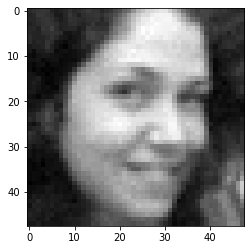

In [37]:
plt.imshow(input_img, cmap='gray')

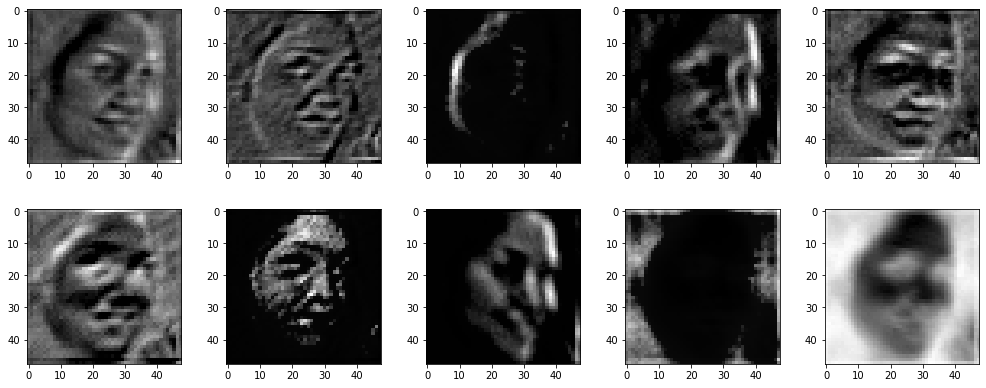

In [38]:
#  // FIRST LAYER

row, col = 2, 5
img_size = 14
fig, axes = plt.subplots(row, col, figsize=(img_size,img_size*row/col))
fig.tight_layout()
fig.subplots_adjust(hspace=.25)

for i in range(row):
    for j in range(col):
        ax = axes[i,j]
        img = outputs1[i*col+j]
        ax.imshow(img, cmap='gray')
        

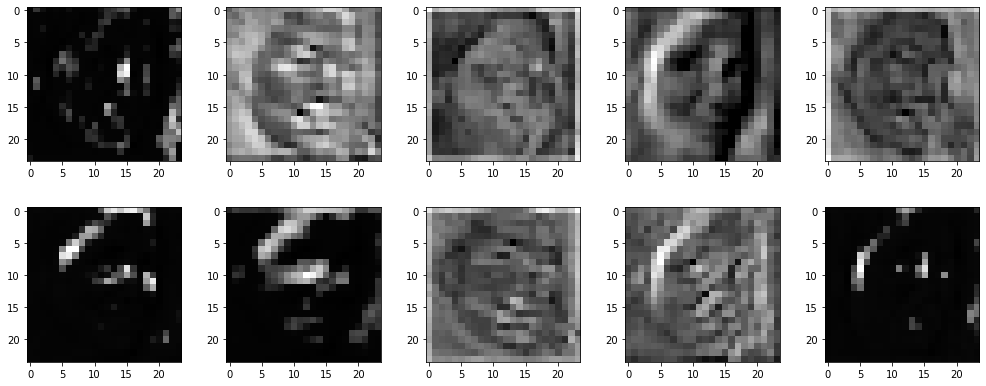

In [39]:
#  // SECOND LAYER

row, col = 2, 5
img_size = 14
fig, axes = plt.subplots(row, col, figsize=(img_size,img_size*row/col))
fig.tight_layout()
fig.subplots_adjust(hspace=.25)

for i in range(row):
    for j in range(col):
        ax = axes[i,j]
        img = outputs2[i*col+j]
        ax.imshow(img, cmap='gray')

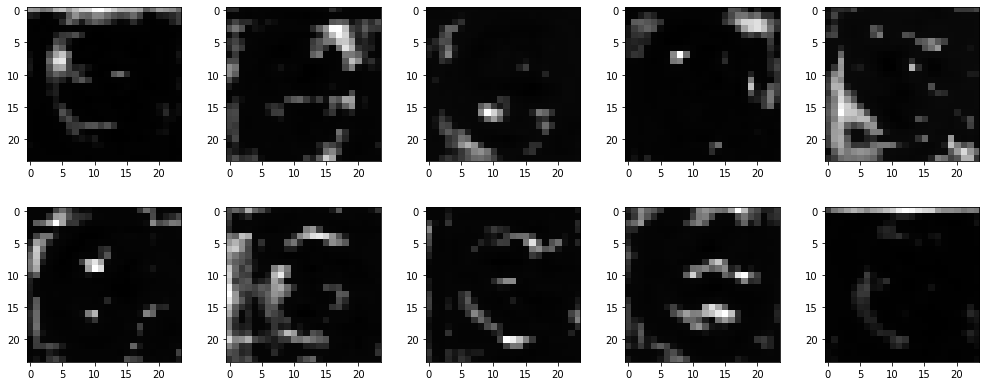

In [40]:
#  // THIRD LAYER

row, col = 2, 5
img_size = 14
fig, axes = plt.subplots(row, col, figsize=(img_size,img_size*row/col))
fig.tight_layout()
fig.subplots_adjust(hspace=.25)

for i in range(row):
    for j in range(col):
        ax = axes[i,j]
        img = outputs3[i*col+j]
        ax.imshow(img, cmap='gray')

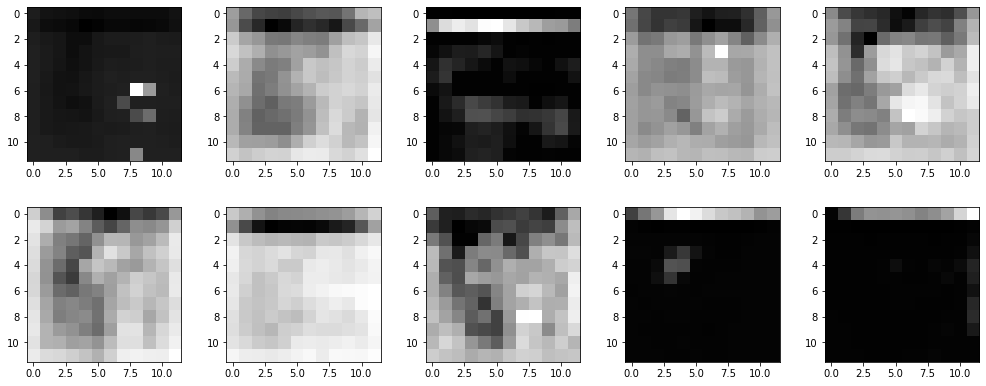

In [41]:
#  // FOURTH LAYER

row, col = 2, 5
img_size = 14
fig, axes = plt.subplots(row, col, figsize=(img_size,img_size*row/col))
fig.tight_layout()
fig.subplots_adjust(hspace=.25)

for i in range(row):
    for j in range(col):
        ax = axes[i,j]
        img = outputs4[i*col+j]
        ax.imshow(img, cmap='gray')

In [42]:
#  SAVING MODEL PARAMETERS
torch.save(net.state_dict(), 'MODEL7V3.pth')

In [43]:
#  // IN CASE WE WANT TO LOAD OUR MODEL

model=MODEL7V3()
model.load_state_dict(torch.load('MODEL7V3.pth'))
model.eval()

MODEL7V3(
  (conv1): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (conv2): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=same)
  (batchnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(64, 128, kernel_size=(7, 7), stride=(1, 1), padding=same)
  (conv4): Conv2d(128, 256, kernel_size=(7, 7), stride=(1, 1), padding=same)
  (batchnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=36864, out_features=128, bias=True)
  (batchnorm3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout1): Dropout(p=0.2, inplace=False)
  (fc2): Linear(in_features=128, out_features=32, bias=True)
  (batchnorm4): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout2): Dropout(p=0.2, inplace=False)
  (f